# Introduction
**Author: Samanyu**<br>
**Language: Python**<br>
**Accelerator: Nonw**

# Reading and Displaying Data

In [1]:
# importing
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import mutual_info_regression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer

In [2]:
df=pd.read_csv(r"C:\Users\Samanyu K\Downloads\student_habits_performance.csv")
df

,student_id,age,gender,study_hours_per_day,social_media_hours,netflix_hours,part_time_job,attendance_percentage,sleep_hours,diet_quality,exercise_frequency,parental_education_level,internet_quality,mental_health_rating,extracurricular_participation,exam_score
0,S1000,23,Female,0.0,1.2,1.1,No,85.0,8.0,Fair,6,Master,Average,8,Yes,56.2
1,S1001,20,Female,6.9,2.8,2.3,No,97.3,4.6,Good,6,High School,Average,8,No,100.0
2,S1002,21,Male,1.4,3.1,1.3,No,94.8,8.0,Poor,1,High School,Poor,1,No,34.3
3,S1003,23,Female,1.0,3.9,1.0,No,71.0,9.2,Poor,4,Master,Good,1,Yes,26.8
4,S1004,19,Female,5.0,4.4,0.5,No,90.9,4.9,Fair,3,Master,Good,1,No,66.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,S1995,21,Female,2.6,0.5,1.6,No,77.0,7.5,Fair,2,High School,Good,6,Yes,76.1
996,S1996,17,Female,2.9,1.0,2.4,Yes,86.0,6.8,Poor,1,High School,Average,6,Yes,65.9
997,S1997,20,Male,3.0,2.6,1.3,No,61.9,6.5,Good,5,Bachelor,Good,9,Yes,64.4
998,S1998,24,Male,5.4,4.1,1.1,Yes,100.0,7.6,Fair,0,Bachelor,Average,1,No,69.7


# Data Preprocessing 

(1000, 16)


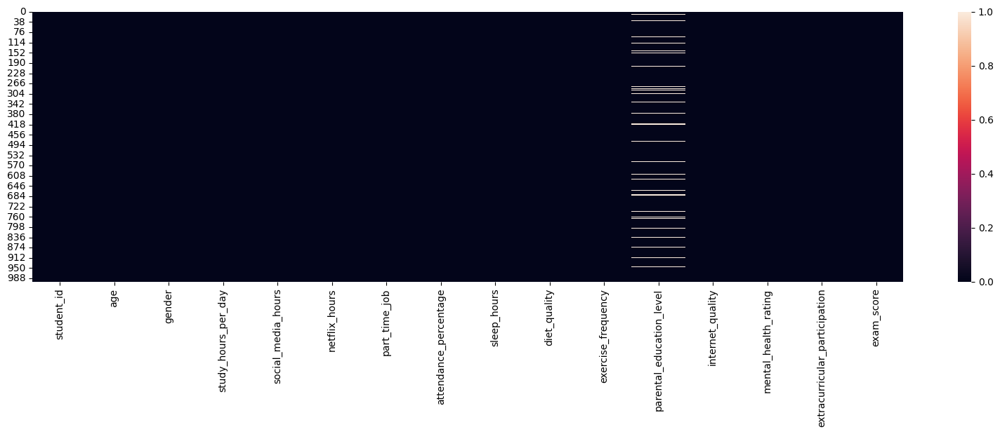

In [3]:
# First let us drop_duplicates then focus on filling in Null values
df.drop_duplicates(inplace=True)
print(df.shape)

# Visualizing null values
plt.figure(figsize=(20,5))
sns.heatmap(df.isnull())
plt.show()

In [4]:
# We have one feature which contains null values
df['parental_education_level'].value_counts()

parental_education_level
High School    392
Bachelor       350
Master         167
Name: count, dtype: int64

In [5]:
# imputing the missing value with the help of the target mean
group_means = df.groupby('parental_education_level')['exam_score'].mean()
fill_value = group_means.sub(df['exam_score'].mean()).abs().idxmin()
df['parental_education_level'].fillna(fill_value, inplace=True)

C:\Users\Samanyu K\AppData\Local\Temp\ipykernel_21580\2508573551.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['parental_education_level'].fillna(fill_value, inplace=True)


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 16 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   student_id                     1000 non-null   object 
 1   age                            1000 non-null   int64  
 2   gender                         1000 non-null   object 
 3   study_hours_per_day            1000 non-null   float64
 4   social_media_hours             1000 non-null   float64
 5   netflix_hours                  1000 non-null   float64
 6   part_time_job                  1000 non-null   object 
 7   attendance_percentage          1000 non-null   float64
 8   sleep_hours                    1000 non-null   float64
 9   diet_quality                   1000 non-null   object 
 10  exercise_frequency             1000 non-null   int64  
 11  parental_education_level       1000 non-null   object 
 12  internet_quality               1000 non-null   ob

In [7]:
# Let us go feature by feature and check for problems
cat_cols=[col for col in df.columns if df[col].dtype=='object']
for col in cat_cols:
    print(df[col].value_counts())

student_id
S1999    1
S1000    1
S1001    1
S1002    1
S1003    1
        ..
S1012    1
S1011    1
S1010    1
S1009    1
S1008    1
Name: count, Length: 1000, dtype: int64
gender
Female    481
Male      477
Other      42
Name: count, dtype: int64
part_time_job
No     785
Yes    215
Name: count, dtype: int64
diet_quality
Fair    437
Good    378
Poor    185
Name: count, dtype: int64
parental_education_level
High School    483
Bachelor       350
Master         167
Name: count, dtype: int64
internet_quality
Good       447
Average    391
Poor       162
Name: count, dtype: int64
extracurricular_participation
No     682
Yes    318
Name: count, dtype: int64


In [8]:
num_cols=[col for col in df.columns if col not in cat_cols]
for col in num_cols:
    print(col,'\n',df[col].describe())

age 
 count    1000.0000
mean       20.4980
std         2.3081
min        17.0000
25%        18.7500
50%        20.0000
75%        23.0000
max        24.0000
Name: age, dtype: float64
study_hours_per_day 
 count    1000.00000
mean        3.55010
std         1.46889
min         0.00000
25%         2.60000
50%         3.50000
75%         4.50000
max         8.30000
Name: study_hours_per_day, dtype: float64
social_media_hours 
 count    1000.000000
mean        2.505500
std         1.172422
min         0.000000
25%         1.700000
50%         2.500000
75%         3.300000
max         7.200000
Name: social_media_hours, dtype: float64
netflix_hours 
 count    1000.000000
mean        1.819700
std         1.075118
min         0.000000
25%         1.000000
50%         1.800000
75%         2.525000
max         5.400000
Name: netflix_hours, dtype: float64
attendance_percentage 
 count    1000.000000
mean       84.131700
std         9.399246
min        56.000000
25%        78.000000
50%        84

In [9]:
# there are no issues with categorical columns
# no issues with numerical columns too
# Data has been cleaned and standardized, before moving towards data visualization we will rename the column names
df.columns

Index(['student_id', 'age', 'gender', 'study_hours_per_day',
       'social_media_hours', 'netflix_hours', 'part_time_job',
       'attendance_percentage', 'sleep_hours', 'diet_quality',
       'exercise_frequency', 'parental_education_level', 'internet_quality',
       'mental_health_rating', 'extracurricular_participation', 'exam_score'],
      dtype='object')

In [10]:
mapp={'student_id':'StudentID','age':'Age','gender':'Gender','study_hours_per_day':'StudyHoursPerDay','social_media_hours':'SocialMediaHours',
       'netflix_hours':'NetflixHours','part_time_job':'PartTimeJob','attendance_percentage':'AttendancePercentage','sleep_hours':'SleepHours',
      'diet_quality':'DietQuality','exercise_frequency':'ExerciseFrequency','parental_education_level':'ParentalEducationLevel','internet_quality':'InternetQuality',
      'mental_health_rating':'MentalHealthRating','extracurricular_participation':'ExtraCurricularParticipation','exam_score':'ExamScore'}
df=df.rename(columns=mapp)
df

,StudentID,Age,Gender,StudyHoursPerDay,SocialMediaHours,NetflixHours,PartTimeJob,AttendancePercentage,SleepHours,DietQuality,ExerciseFrequency,ParentalEducationLevel,InternetQuality,MentalHealthRating,ExtraCurricularParticipation,ExamScore
0,S1000,23,Female,0.0,1.2,1.1,No,85.0,8.0,Fair,6,Master,Average,8,Yes,56.2
1,S1001,20,Female,6.9,2.8,2.3,No,97.3,4.6,Good,6,High School,Average,8,No,100.0
2,S1002,21,Male,1.4,3.1,1.3,No,94.8,8.0,Poor,1,High School,Poor,1,No,34.3
3,S1003,23,Female,1.0,3.9,1.0,No,71.0,9.2,Poor,4,Master,Good,1,Yes,26.8
4,S1004,19,Female,5.0,4.4,0.5,No,90.9,4.9,Fair,3,Master,Good,1,No,66.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,S1995,21,Female,2.6,0.5,1.6,No,77.0,7.5,Fair,2,High School,Good,6,Yes,76.1
996,S1996,17,Female,2.9,1.0,2.4,Yes,86.0,6.8,Poor,1,High School,Average,6,Yes,65.9
997,S1997,20,Male,3.0,2.6,1.3,No,61.9,6.5,Good,5,Bachelor,Good,9,Yes,64.4
998,S1998,24,Male,5.4,4.1,1.1,Yes,100.0,7.6,Fair,0,Bachelor,Average,1,No,69.7


# Data Visualization

In [11]:
# copying the dataframe to a temporary dataframe
tdf=df.copy()
# Dropping columns which we wont have any use for 
df.drop(columns='StudentID',inplace=True)

In [12]:
# visualizing individual features
cat_cols=[col for col in tdf.columns if tdf[col].dtype=='object']
num_cols=[col for col in tdf.columns if tdf[col].dtype!='object']
cat_cols = [col for col in cat_cols if col != 'StudentID']

print(cat_cols,'\n\n')
print(num_cols)

['Gender', 'PartTimeJob', 'DietQuality', 'ParentalEducationLevel', 'InternetQuality', 'ExtraCurricularParticipation'] 


['Age', 'StudyHoursPerDay', 'SocialMediaHours', 'NetflixHours', 'AttendancePercentage', 'SleepHours', 'ExerciseFrequency', 'MentalHealthRating', 'ExamScore']


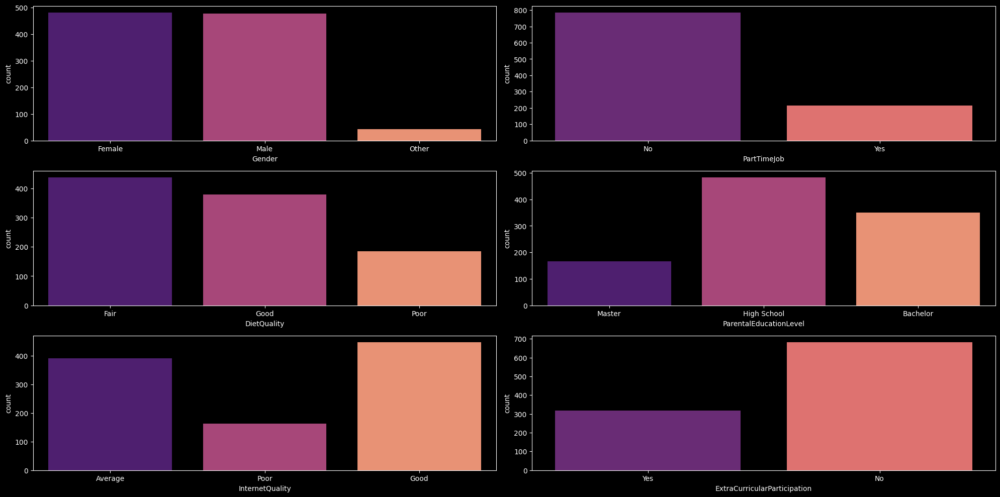

In [13]:
plt.style.use('dark_background')
fig,ax=plt.subplots(3,2,figsize=(20,10))
ax=ax.flatten()
i=0
for col in cat_cols:
    sns.countplot(data=tdf,x=col,ax=ax[i],hue=col,palette='magma')
    i+=1
plt.tight_layout()
plt.show()

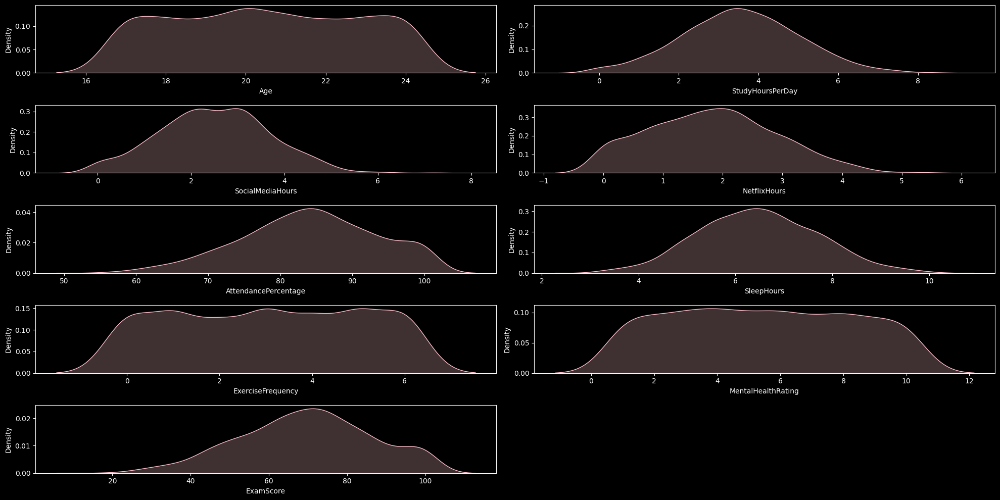

In [14]:
fig,ax=plt.subplots(5,2,figsize=(20,10))
ax=ax.flatten()
i=0
for col in num_cols:
    sns.kdeplot(data=tdf,x=col,ax=ax[i],color='pink',fill=True)
    i+=1
plt.tight_layout()
ax[9].axis('off')
plt.show()

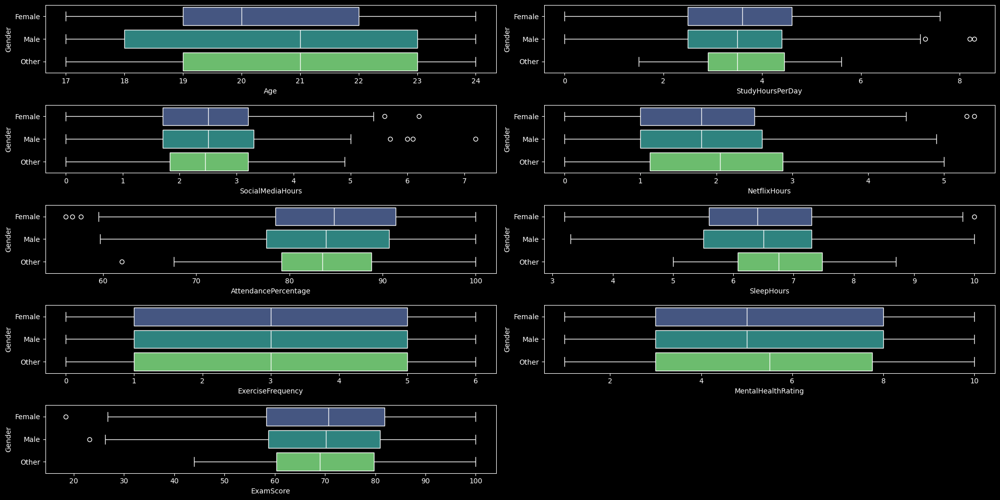

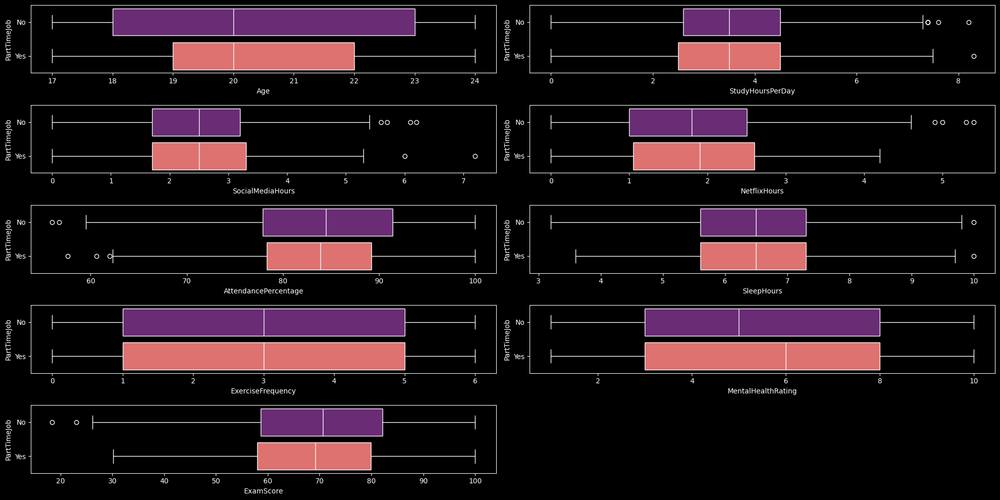

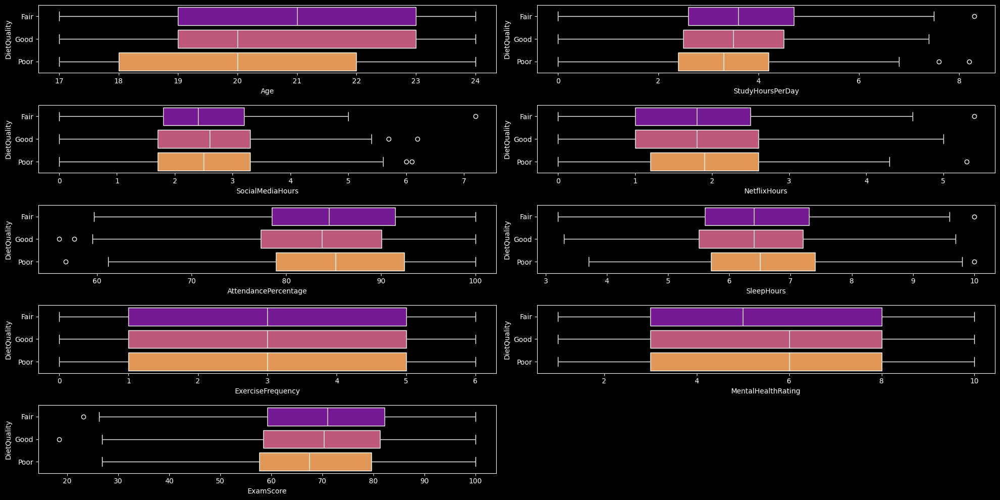

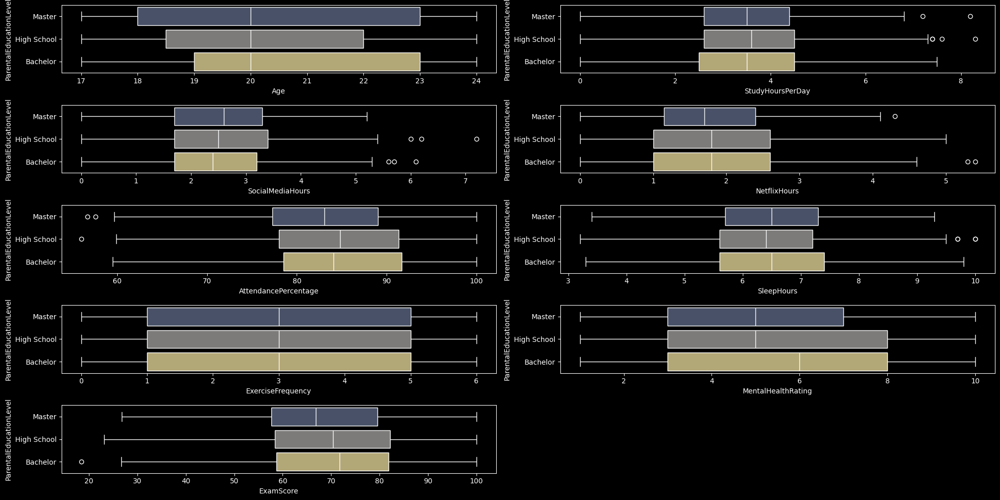

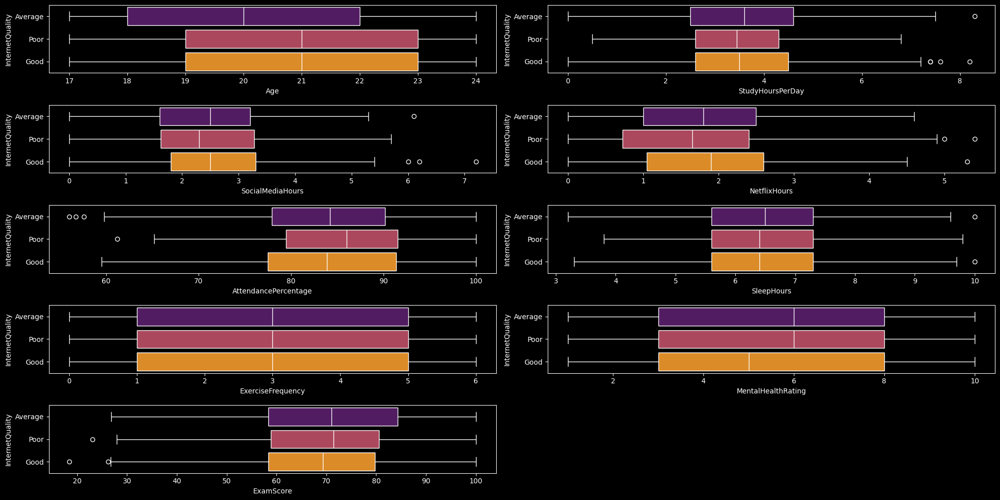

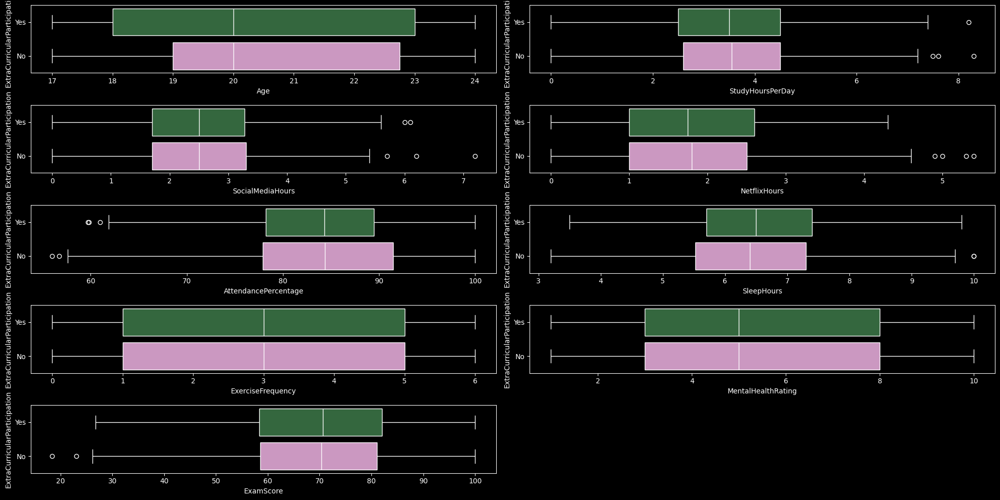

In [15]:
# Boxplots for all numerical columns against categorical columns to look at how the data is distributed with each cateogry

map1 = ['viridis', 'magma', 'plasma', 'cividis', 'inferno', 'cubehelix']
j=0
for col1 in cat_cols:
    fig,ax=plt.subplots(5,2,figsize=(20,10))
    ax=ax.flatten()
    i=0
    for col in num_cols:
        sns.boxplot(data=tdf,x=col,y=col1,ax=ax[i],hue=col1,palette=map1[j],boxprops=dict(edgecolor='white'),medianprops=dict(color='white'),
                    whiskerprops=dict(color='white'),capprops=dict(color='white'),flierprops=dict(markeredgecolor='white'))
        i+=1
    j+=1
    plt.tight_layout()
    ax[9].axis('off')
    plt.show()

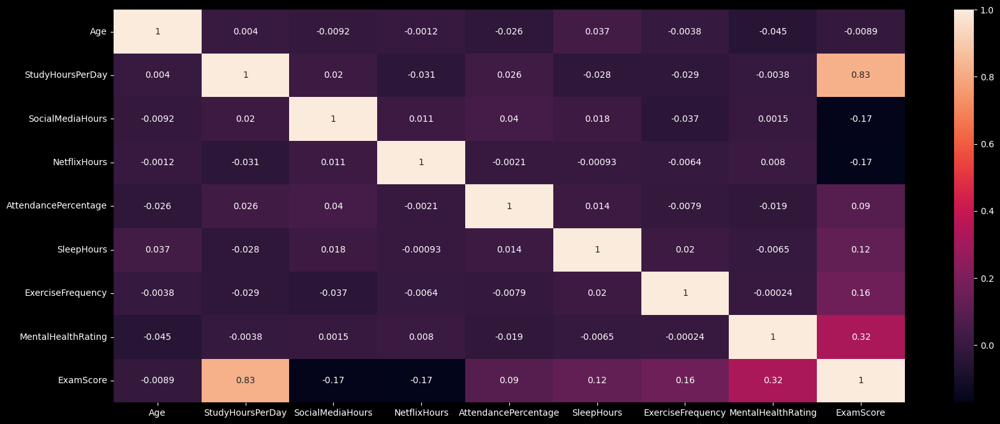

In [16]:
# Let us plot some scatter plots for numerical columns to find the relationship between these columns
# We can first plot the correlation matrix to find the correlated numerical features then plot the scatter plots, this makes sure we don't simply plot useless  visuals

corr1=tdf[num_cols].corr()
plt.figure(figsize=(20,8))
sns.heatmap(corr1,annot=True)
plt.show()

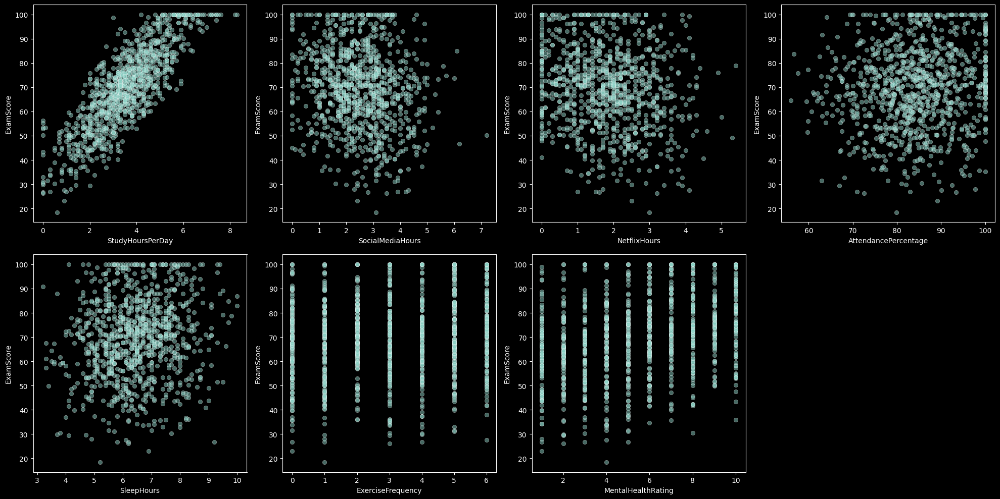

In [17]:
# Let us plot these scatter plots
# Exam Score against numerical columns except for age

new_num_cols=[col for col in num_cols if col!='Age' and col!='ExamScore']

fig,ax=plt.subplots(2,4,figsize=(20,10))
ax=ax.flatten()

i=0
for col in new_num_cols:
    sns.scatterplot(data=tdf,x=col,y='ExamScore',alpha=0.5,ax=ax[i])
    i+=1
plt.tight_layout()
ax[7].axis('off')
plt.show()

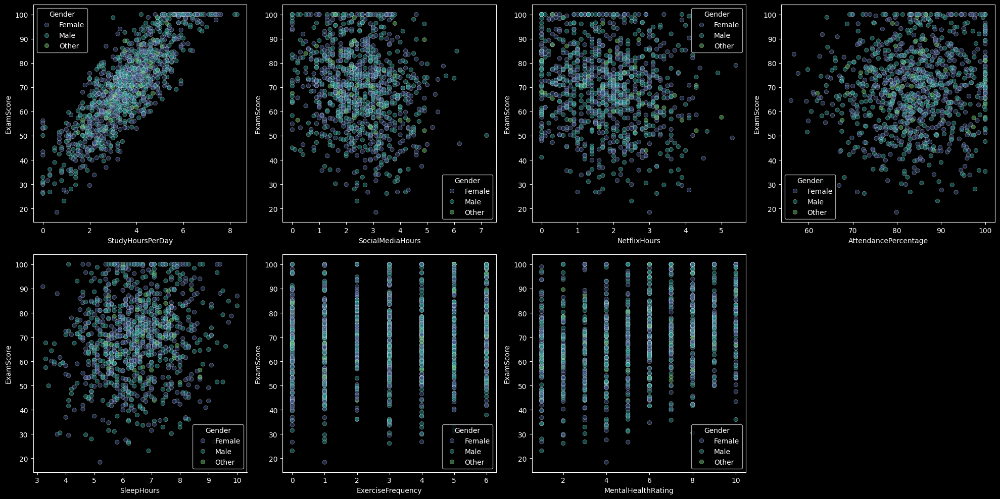

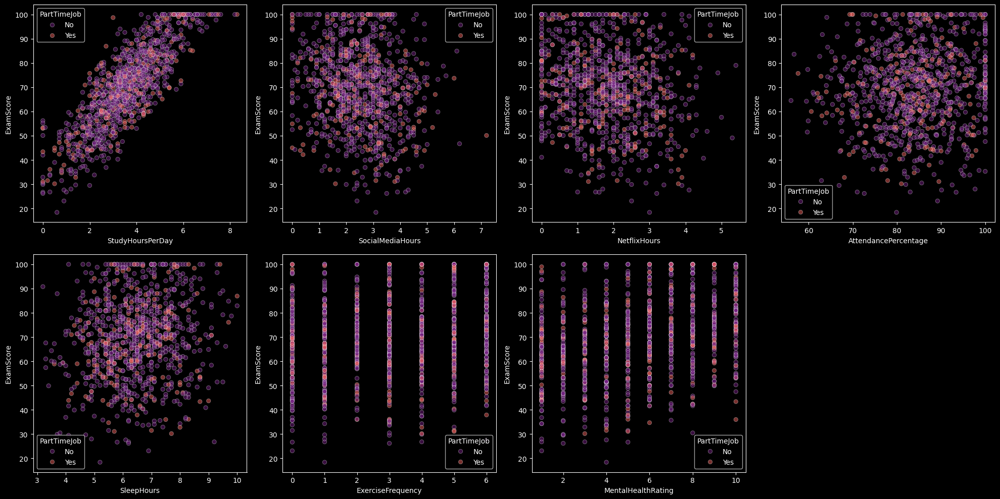

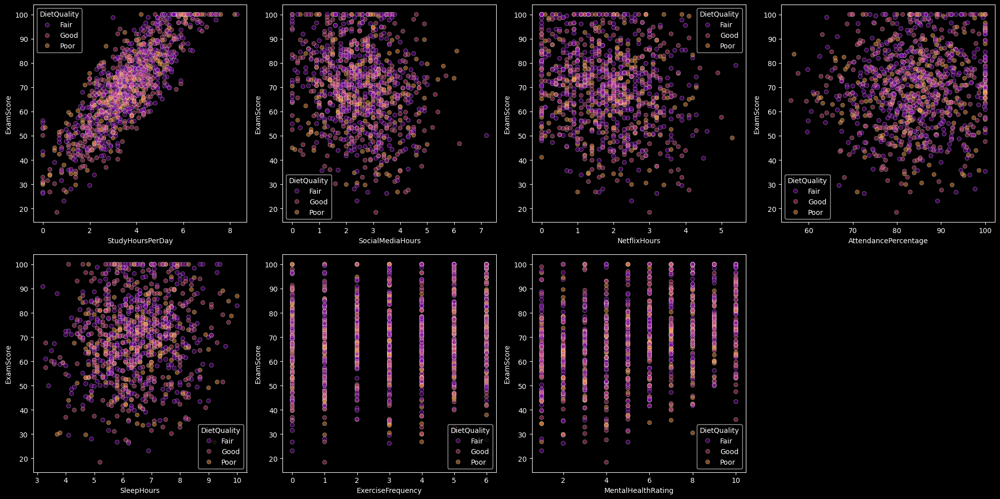

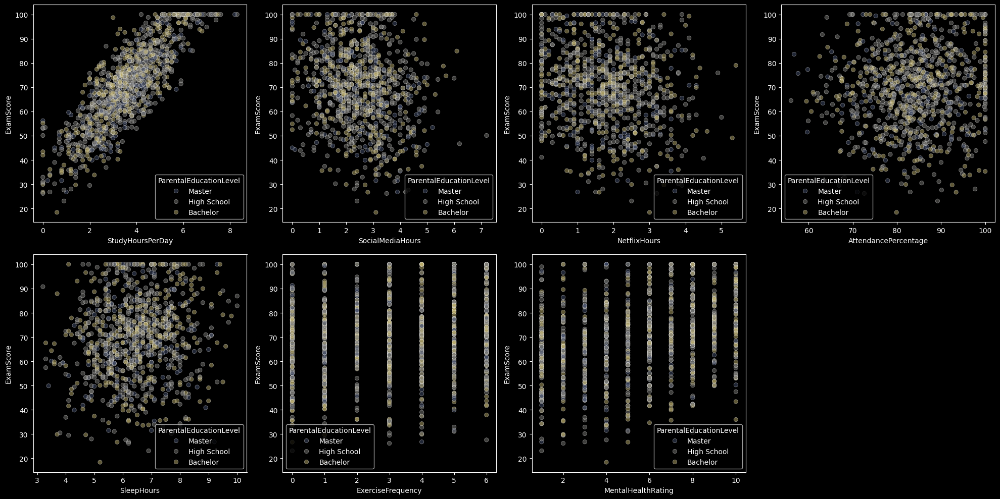

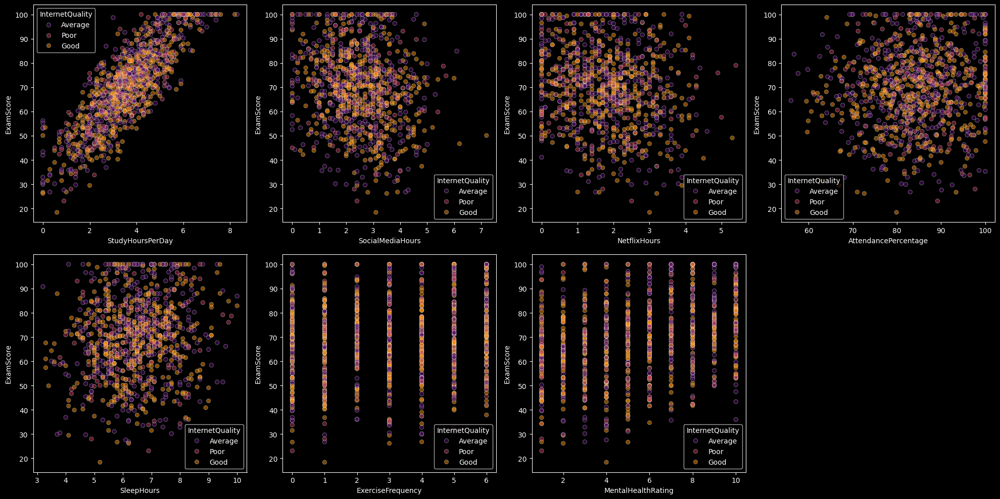

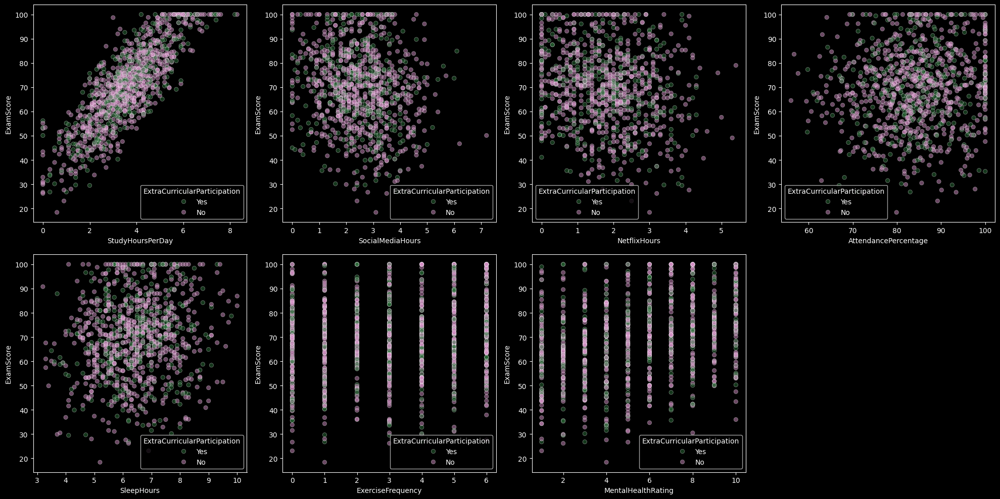

In [18]:
# Let us have these same plots but with differentiation using categorical columns

map1 = ['viridis', 'magma', 'plasma', 'cividis', 'inferno', 'cubehelix']
j=0
for col1 in cat_cols:
    fig,ax=plt.subplots(2,4,figsize=(20,10))
    ax=ax.flatten()

    i=0
    for col in new_num_cols:
        sns.scatterplot(data=tdf,x=col,y='ExamScore',alpha=0.5,ax=ax[i],hue=col1,palette=map1[j])
        i+=1
    j+=1
    plt.tight_layout()
    ax[7].axis('off')
    plt.show()

In [19]:
# We don't really find soo much of useful info but enough to get us to build a nice model
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Age                           1000 non-null   int64  
 1   Gender                        1000 non-null   object 
 2   StudyHoursPerDay              1000 non-null   float64
 3   SocialMediaHours              1000 non-null   float64
 4   NetflixHours                  1000 non-null   float64
 5   PartTimeJob                   1000 non-null   object 
 6   AttendancePercentage          1000 non-null   float64
 7   SleepHours                    1000 non-null   float64
 8   DietQuality                   1000 non-null   object 
 9   ExerciseFrequency             1000 non-null   int64  
 10  ParentalEducationLevel        1000 non-null   object 
 11  InternetQuality               1000 non-null   object 
 12  MentalHealthRating            1000 non-null   int64  
 13  Extr

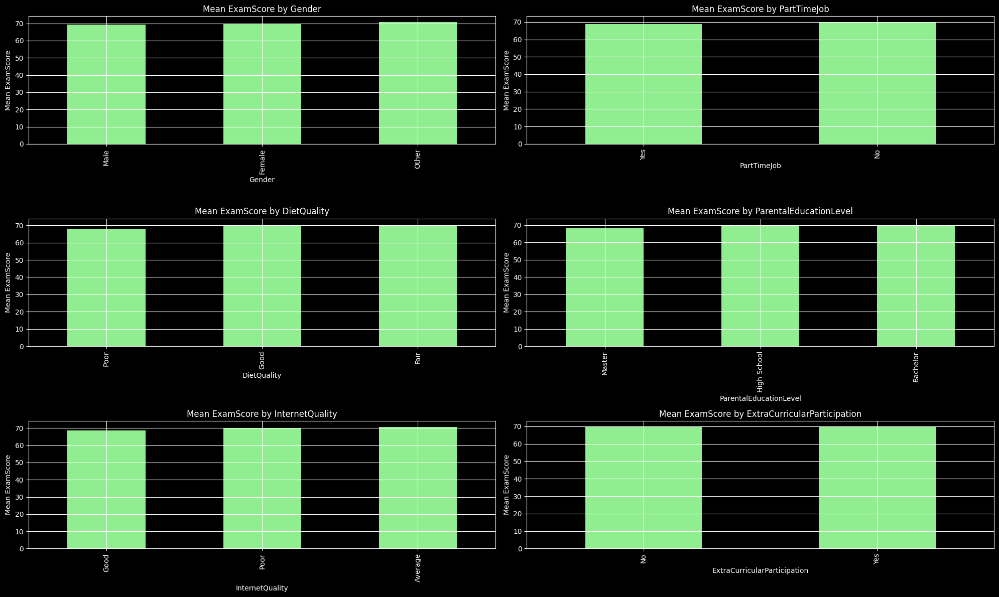

In [20]:
fig, ax = plt.subplots(3, 2, figsize=(20, 12))
ax = ax.flatten()

for i, col in enumerate(cat_cols):
    tdf.groupby(col)['ExamScore'].mean().sort_values().plot(kind='bar', ax=ax[i], color='lightgreen')
    ax[i].set_title(f"Mean ExamScore by {col}")
    ax[i].set_ylabel("Mean ExamScore")
    ax[i].set_xlabel(col)
    ax[i].grid(True)

plt.tight_layout()
plt.show()


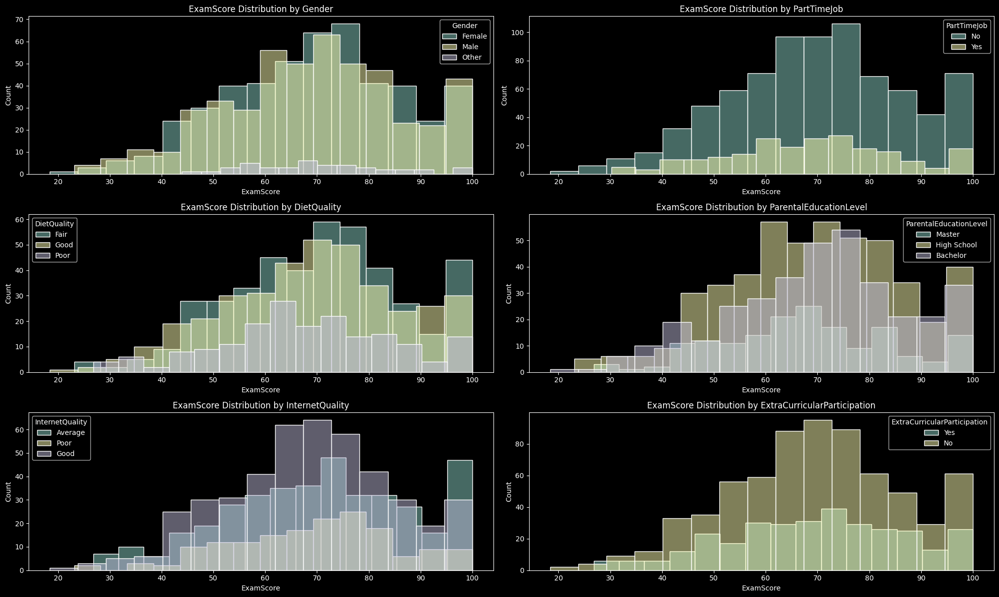

In [21]:
# This is similar columns as the boxplots but provides us with better insights
fig, ax = plt.subplots(3, 2, figsize=(20, 12))
ax = ax.flatten()

for i, col in enumerate(cat_cols):
    for val in tdf[col].unique():
        sns.histplot(data=tdf[tdf[col]==val], x='ExamScore', kde=False, ax=ax[i], label=str(val), alpha=0.5, bins=15)
    ax[i].set_title(f'ExamScore Distribution by {col}')
    ax[i].legend(title=col)

plt.tight_layout()
plt.show()

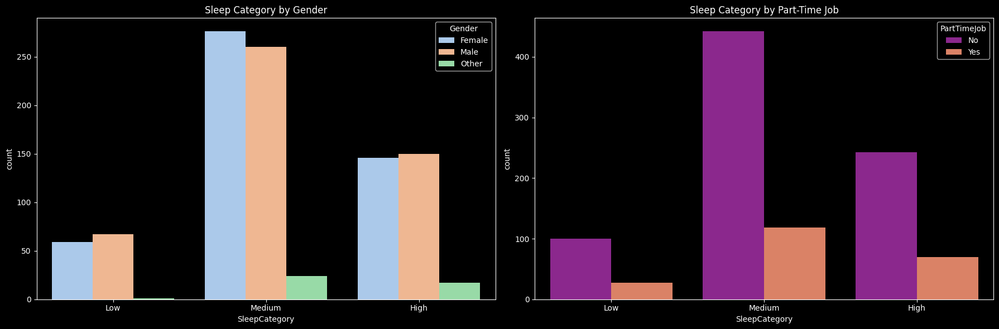

In [22]:
tdf['SleepCategory'] = pd.cut(tdf['SleepHours'], bins=[0, 5, 7, 10], labels=['Low', 'Medium', 'High'])

fig, ax = plt.subplots(1, 2, figsize=(18, 6))
sns.countplot(data=tdf, x='SleepCategory', hue='Gender', ax=ax[0], palette='pastel')
ax[0].set_title("Sleep Category by Gender")

sns.countplot(data=tdf, x='SleepCategory', hue='PartTimeJob', ax=ax[1], palette='plasma')
ax[1].set_title("Sleep Category by Part-Time Job")

plt.tight_layout()
plt.show()

C:\Users\Samanyu K\AppData\Local\Temp\ipykernel_21580\3702627987.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=tdf, x='InternetQuality', y='StudyHoursPerDay', palette='coolwarm')


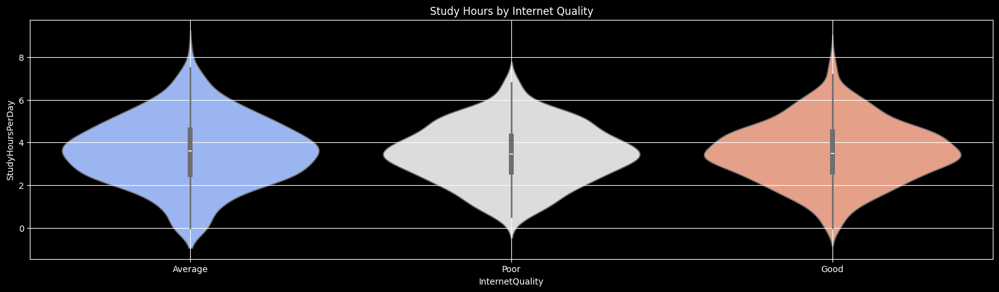

In [23]:
plt.figure(figsize=(20, 5))
sns.violinplot(data=tdf, x='InternetQuality', y='StudyHoursPerDay', palette='coolwarm')
plt.title("Study Hours by Internet Quality")
plt.grid(True)
plt.show()

# Data Preparation

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Age                           1000 non-null   int64  
 1   Gender                        1000 non-null   object 
 2   StudyHoursPerDay              1000 non-null   float64
 3   SocialMediaHours              1000 non-null   float64
 4   NetflixHours                  1000 non-null   float64
 5   PartTimeJob                   1000 non-null   object 
 6   AttendancePercentage          1000 non-null   float64
 7   SleepHours                    1000 non-null   float64
 8   DietQuality                   1000 non-null   object 
 9   ExerciseFrequency             1000 non-null   int64  
 10  ParentalEducationLevel        1000 non-null   object 
 11  InternetQuality               1000 non-null   object 
 12  MentalHealthRating            1000 non-null   int64  
 13  Extr

In [25]:
# Encoding Categorical columns
le=LabelEncoder()
for col in df.columns[df.dtypes=='object']:
    df[col]=le.fit_transform(df[col])

In [26]:
def create_features(df):
    # 1. Ratio Features
    df['study_sleep_ratio'] = df['StudyHoursPerDay'] / (df['SleepHours'] + 1)
    df['study_social_ratio'] = df['StudyHoursPerDay'] / (df['SocialMediaHours'] + 1)
    df['study_netflix_ratio'] = df['StudyHoursPerDay'] / (df['NetflixHours'] + 1)
    df['mental_diet_ratio'] = df['MentalHealthRating'] / (df['DietQuality'] + 1)
    df['active_vs_sedentary'] = (df['ExerciseFrequency'] + 1) / (df['NetflixHours'] + df['SocialMediaHours'] + 1)

    # 2. Interaction Features
    df['study_mental'] = df['StudyHoursPerDay'] * df['MentalHealthRating']
    df['study_attendance'] = df['StudyHoursPerDay'] * df['AttendancePercentage']
    df['sleep_exercise'] = df['SleepHours'] * df['ExerciseFrequency']
    df['study_minus_netflix'] = df['StudyHoursPerDay'] - df['NetflixHours']
    df['study_minus_social'] = df['StudyHoursPerDay'] - df['SocialMediaHours']

    # 3. Binned Features
    df['study_level'] = pd.cut(df['StudyHoursPerDay'], bins=[0, 2, 5, 10], labels=[0, 1, 2])
    df['mental_health_bin'] = pd.cut(df['MentalHealthRating'], bins=[0, 3, 7, 10], labels=[0, 1, 2])
    df['sleep_category'] = pd.cut(df['SleepHours'], bins=[0, 5, 8, 12], labels=[0, 1, 2])
    df['attendance_category'] = pd.cut(df['AttendancePercentage'], bins=[0, 70, 90, 100], labels=[0, 1, 2])
    df['exercise_level'] = pd.cut(df['ExerciseFrequency'], bins=[0, 2, 5, 7], labels=[0, 1, 2])

    # 4. Nonlinear/Statistical Transforms
    df['log_study_hours'] = np.log1p(df['StudyHoursPerDay'])
    df['log_social_media'] = np.log1p(df['SocialMediaHours'])
    df['study_hours_squared'] = df['StudyHoursPerDay'] ** 2
    df['netflix_squared'] = df['NetflixHours'] ** 2
    df['sqrt_sleep'] = np.sqrt(df['SleepHours'])

    # 5. Engagement & Sedentary Scores
    df['engagement_score'] = (df['AttendancePercentage'] + df['ExtraCurricularParticipation']) / 2
    df['sedentary_hours'] = df['NetflixHours'] + df['SocialMediaHours']
    df['internet_study'] = df['InternetQuality'] * df['StudyHoursPerDay']
    df['internet_mental'] = df['InternetQuality'] * df['MentalHealthRating']

    # 6. Misc. interaction & normalized features
    df['attendance_normalized'] = df['AttendancePercentage'] / 100
    df['diet_inverse'] = 1 / (df['DietQuality'] + 1)
    df['sleep_quality'] = (df['SleepHours'] * df['MentalHealthRating']) / (df['DietQuality'] + 1)
    df['study_engagement_index'] = df['StudyHoursPerDay'] * df['engagement_score']

    # 7. Behavioral consistency (std dev across passive activities)
    df['passive_std'] = df[['SleepHours', 'NetflixHours', 'SocialMediaHours']].std(axis=1)

    return df
create_features(df)
cols=['Age','Gender','DietQuality','PartTimeJob','NetflixHours','InternetQuality','ExtraCurricularParticipation','diet_inverse','SocialMediaHours',
     'log_social_media','sleep_category']
df.drop(columns=cols,inplace=True)

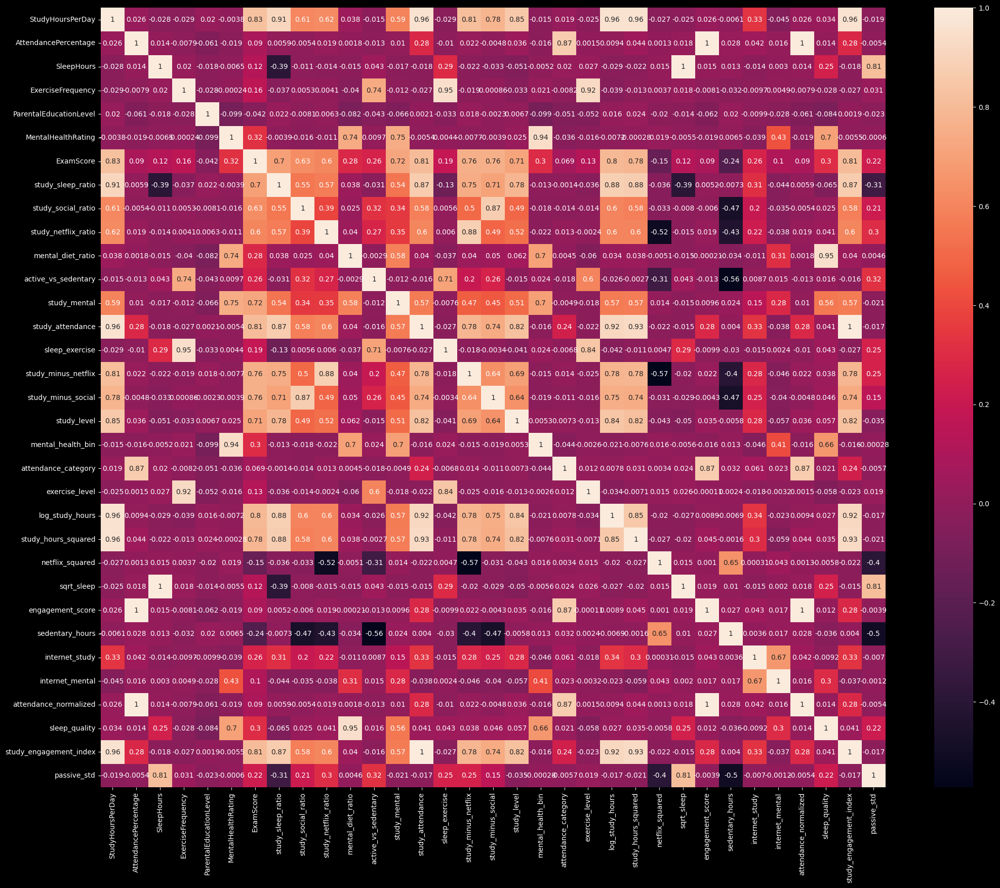

In [27]:
# Visualizing the correlation matrix and calculating Mutual Information
plt.figure(figsize=(25,20))
sns.heatmap(df.corr(),annot=True)
plt.show()

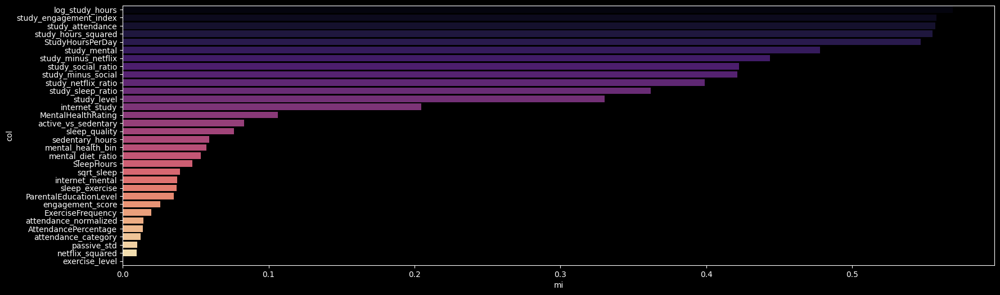

In [28]:
# Calculating Mutual Information
x=df.drop(columns='ExamScore')
y=df['ExamScore']
X_imputed = pd.DataFrame(SimpleImputer(strategy='median').fit_transform(x), columns=x.columns)

# Step 3: Compute Mutual Information
mi = mutual_info_regression(X_imputed, y)

mi_df=pd.DataFrame({'col':x.columns,'mi':mi})
mi_df.sort_values(by='mi',ascending=False,inplace=True)

plt.figure(figsize=(20,6))
sns.barplot(data=mi_df,x='mi',y='col',hue='col',palette='magma')
plt.show()

In [29]:
xt,x_te,yt,y_te=train_test_split(x,y,random_state=10,test_size=0.2)
print(xt.shape,x_te.shape,yt.shape,y_te.shape)

(800, 32) (200, 32) (800,) (200,)


# Model

In [30]:
xt.info()

<class 'pandas.core.frame.DataFrame'>
Index: 800 entries, 188 to 265
Data columns (total 32 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   StudyHoursPerDay        800 non-null    float64 
 1   AttendancePercentage    800 non-null    float64 
 2   SleepHours              800 non-null    float64 
 3   ExerciseFrequency       800 non-null    int64   
 4   ParentalEducationLevel  800 non-null    int64   
 5   MentalHealthRating      800 non-null    int64   
 6   study_sleep_ratio       800 non-null    float64 
 7   study_social_ratio      800 non-null    float64 
 8   study_netflix_ratio     800 non-null    float64 
 9   mental_diet_ratio       800 non-null    float64 
 10  active_vs_sedentary     800 non-null    float64 
 11  study_mental            800 non-null    float64 
 12  study_attendance        800 non-null    float64 
 13  sleep_exercise          800 non-null    float64 
 14  study_minus_netflix     800 n

In [31]:
from xgboost import XGBRegressor

# Make sure the categorical columns are properly typed
cat_cols = ['study_level', 'mental_health_bin', 'attendance_category', 'exercise_level']
xt[cat_cols] = xt[cat_cols].astype('category')

xgb = XGBRegressor(
    n_estimators=200,
    random_state=20,
    enable_categorical=True  # critical
)

mod = xgb.fit(xt, yt)


In [32]:
predt=mod.predict(xt)
pred=mod.predict(x_te)

In [33]:
print(r2_score(yt,predt))
print(mean_squared_error(yt,predt))
print(mean_absolute_error(yt,predt))

0.9999999716789383
8.134870515278951e-06
0.0018934116363527264


In [34]:
print(r2_score(y_te,pred))
print(mean_squared_error(y_te,pred))
print(mean_absolute_error(y_te,pred))

0.8521899237042898
40.18608620801064
5.064541206359864


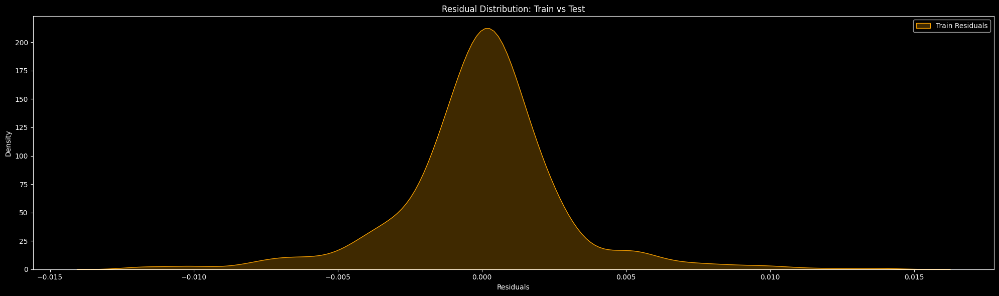

In [38]:
plt.figure(figsize=(20, 6))
sns.kdeplot(yt - predt, color='orange', fill=True, label='Train Residuals')
plt.title("Residual Distribution: Train ")
plt.xlabel("Residuals")
plt.ylabel("Density")
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
plt.figure(figsize=(20, 6))
sns.kdeplot(yt - predt, color='orange', fill=True, label='Train Residuals')
plt.title("Residual Distribution: Train ")
plt.xlabel("Residuals")
plt.ylabel("Density")
plt.legend()
plt.tight_layout()
plt.show()